Este notebook foi feito no google colab. Algumas funcionalidades podem ser diferentes das de outros editores como o jupyter notebook, por exemplo.

In [ ]:
#Importar bibliotecas necessárias

import os
from pathlib import Path
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import random
import warnings

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.feature_selection import mutual_info_classif, RFE


warnings.filterwarnings('ignore')
%matplotlib inline

In [ ]:
#Importar o google drive para o notebook

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Diretório com o dataset

features_df_dir = Path(r"/content/drive/MyDrive/lidc/features.csv")

In [ ]:
#Dataframe com o dataset

features_df = pd.read_csv(features_df_dir)
features_df = features_df.drop("ID", axis=1)
features_df.head()

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength,malignancy
0,0.971849,0.237372,7.523759,31.696116,38.013156,35.128336,44.045431,47.675990,4906.875000,30.803832,...,0.002874,6.470309,0.337235,567.412320,0.418091,0.001276,2898.780826,0.262738,1.433190,5
1,0.916718,0.587702,20.146223,34.279675,39.051248,48.166378,45.276926,48.590122,12551.541667,31.424805,...,0.008371,6.954316,0.129099,2175.147662,1.818630,0.001155,963.926503,0.048390,0.980011,5
2,0.778668,0.187225,5.949320,31.776383,32.015621,31.016125,38.832976,39.673669,2509.250000,24.743257,...,0.013967,6.693464,0.282061,77.874166,0.540909,0.003731,1918.619966,0.090857,4.007826,2
3,0.792367,0.247122,6.629813,26.828139,28.160256,26.000000,35.846897,35.860842,2484.291667,21.257727,...,0.007631,5.889404,0.322722,337.124671,0.642915,0.002317,1121.577460,0.187159,0.886752,5
4,0.712728,0.156227,1.915424,12.260528,9.055385,13.000000,13.601471,13.601471,146.166667,8.738420,...,0.060143,5.078002,0.600000,3.770609,0.125592,0.031477,712.382279,0.650644,6.024134,4


In [ ]:
#Função para analisar os dados de um dataframe
"""
Imprime o número total de nódulos, o número de features, o número de nódulos de cada malignancy
e a percentagem em função do número total
Imprime também um gráfico de barras com o número de nódulos de cada classe
"""

def analize_data(df):
    nodules = df.shape[0]
    features = df.shape[1] - 1

    one = len(df[df.malignancy == 1])
    two = len(df[df.malignancy == 2])
    three = len(df[df.malignancy == 3])
    four = len(df[df.malignancy == 4])
    five = len(df[df.malignancy == 5])

    val = [one, two, three, four, five]

    per_one = (float(one)/nodules) * 100
    per_two = (float(two)/nodules) * 100
    per_three = (float(three)/nodules) * 100
    per_four = (float(four)/nodules) * 100
    per_five = (float(five)/nodules) * 100

    print(f'Total de nódulos:{nodules}')
    print(f'Total de features:{features}')
    print(f'Total de nódulos com malignancy 1: {one}({per_one:.2f}%)')
    print(f'Total de nódulos com malignancy 2: {two}({per_two:.2f}%)')
    print(f'Total de nódulos com malignancy 3: {three}({per_three:.2f}%)')
    print(f'Total de nódulos com malignancy 4: {four}({per_four:.2f}%)')
    print(f'Total de nódulos com malignancy 5: {five}({per_five:.2f}%)')

    print()

    x = np.arange(5)
    plt.bar(x,val)
    plt.xticks(x, ('one', 'two', 'three', 'four', 'five'))
    plt.show()

Total de nódulos:2483
Total de features:107
Total de nódulos com malignancy 1: 332(13.37%)
Total de nódulos com malignancy 2: 467(18.81%)
Total de nódulos com malignancy 3: 1188(47.85%)
Total de nódulos com malignancy 4: 217(8.74%)
Total de nódulos com malignancy 5: 279(11.24%)



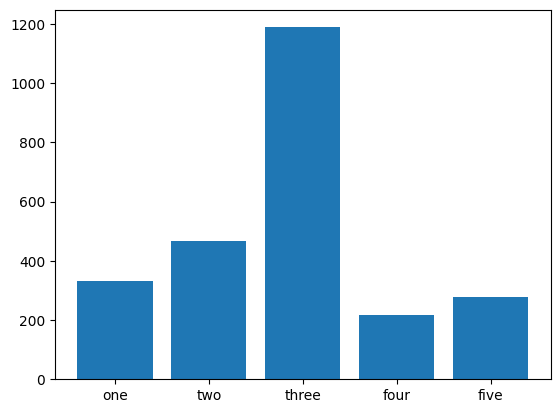

In [ ]:
#Analisar os dados do dataset original
"""
Como podemos ver pelas percentagens de cada classe e no gráfico de barras, quase metade dos nódulos têm malignancy 3,
o que faz com que haja uma grande discrepância na distribuição das classes neste dataset
"""

analize_data(features_df)

Total de nódulos:1594
Total de features:107
Total de nódulos com malignancy 1: 332(20.83%)
Total de nódulos com malignancy 2: 350(21.96%)
Total de nódulos com malignancy 3: 416(26.10%)
Total de nódulos com malignancy 4: 217(13.61%)
Total de nódulos com malignancy 5: 279(17.50%)



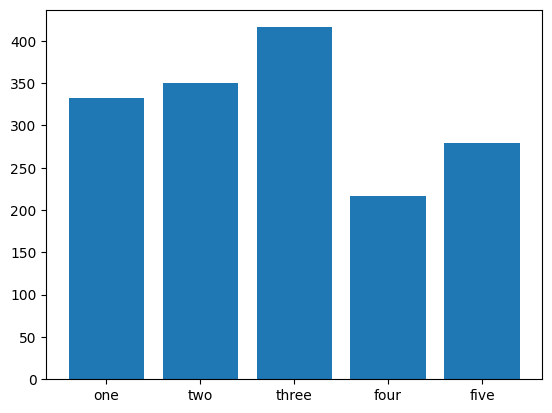

In [ ]:
#Criar um dataset com menos 65% dos nódulos cim malignancy 3 e menos 25% dos nódulos com malignancy 2 e analisá-lo
"""
Decidimo que, para além de treinar com o dataset normal obtido através da segmentação,
iamos treinar o modelo com um dataset com o número de exemplos de cada classe mais equilibrado
Como podemos ver pelas percentagens de cada classe e pelo gráfico de barras este dataset mantém a distribuição das classes, 
aproximando os valores
"""

malignancy_3_rows = features_df[features_df['malignancy'] == 3]

frac_to_drop = 0.65

if len(malignancy_3_rows) > 0:
    rows_to_drop = malignancy_3_rows.sample(frac=frac_to_drop, random_state=42)
    reduced_nodules_features_df = features_df.drop(rows_to_drop.index)

malignancy_2_rows = reduced_nodules_features_df[reduced_nodules_features_df['malignancy'] == 2]

frac_to_drop = 0.25

if len(malignancy_2_rows) > 0:
    rows_to_drop = malignancy_2_rows.sample(frac=frac_to_drop, random_state=42)
    reduced_nodules_features_df = reduced_nodules_features_df.drop(rows_to_drop.index)

reduced_nodules_features_df = reduced_nodules_features_df.reset_index(drop=True)

analize_data(reduced_nodules_features_df)

In [ ]:
#Função para obter o melhor classificador
"""
Decidimos usar o RandomizedSearchCV em vez GridSearchCV para o tempo de execução ser menor,
talvez com o GridSearchCV ou com um número maior de iterações do RandomizedSearchCV 
(usamos o número de iterações default que são 10) obtivéssemos melhores resultados
"""

def get_best_clf(X, y):

    param_grid = {
        'n_estimators': [200, 500],
        'max_features': ['auto', 'sqrt', 'log2'],      #Grelha com os parâmetros
        'max_depth' : [4,5,6,7,8],
        'criterion' : ['gini', 'entropy']
    }

    rfc = RandomForestClassifier(random_state=42)  #Classificador em que os parâmetros são testados
    CV_rfc = RandomizedSearchCV(rfc, param_grid)
    CV_rfc.fit(X, y)

    return CV_rfc.best_estimator_ #Retorna o melhor classificador

In [ ]:
#Função para imprimir a matriz confusão dos resultados obtidos

def print_confusion_matrix(pred, y_test):

    cm = confusion_matrix(y_test, pred)
    labels = ['one', 'two', 'three', 'four', 'five']  #Lista com as malignancies
    sns.heatmap(cm, annot=True, fmt="d", cmap="crest", xticklabels=labels, yticklabels=labels)

    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

In [ ]:
#Função para treinar o modelo e imprimir os resultados obtidos

"""
Optámos por usar o algoritmo random forest devido a não termos grandes conhecimentos sobre as features
Esta função cria um dataset de treino e de teste, chama a função get_best_clf para obter o  melhor
classificador e faz as previsões com o classificador que obteve, calcula a accuracy e imprime a matriz confusão
Esta função retorna o melhor classificador
"""

def train_model(X, y):

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

    best_clf = get_best_clf(X_train, y_train)

    pred = best_clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred)

    print(f"Test accuracy:{accuracy:.4f}")
    print_confusion_matrix(pred, y_test)
    print(best_clf)

    return best_clf

Treinar com todos os nódulos:

Test accuracy:0.6094


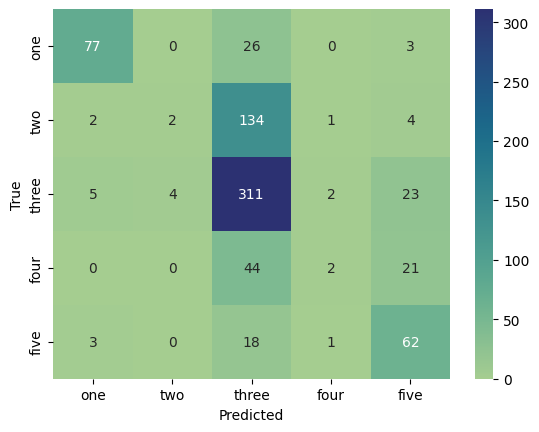

RandomForestClassifier(criterion='entropy', max_depth=6, n_estimators=500,
                       random_state=42)


RandomForestClassifier(criterion='entropy', max_depth=6, n_estimators=500,
                       random_state=42)

In [ ]:
#Treinar com todas as features obtidas com o pyradiomics

X = features_df.drop("malignancy", axis=1)
y = features_df[["malignancy"]]

train_model(X, y)

<Axes: >

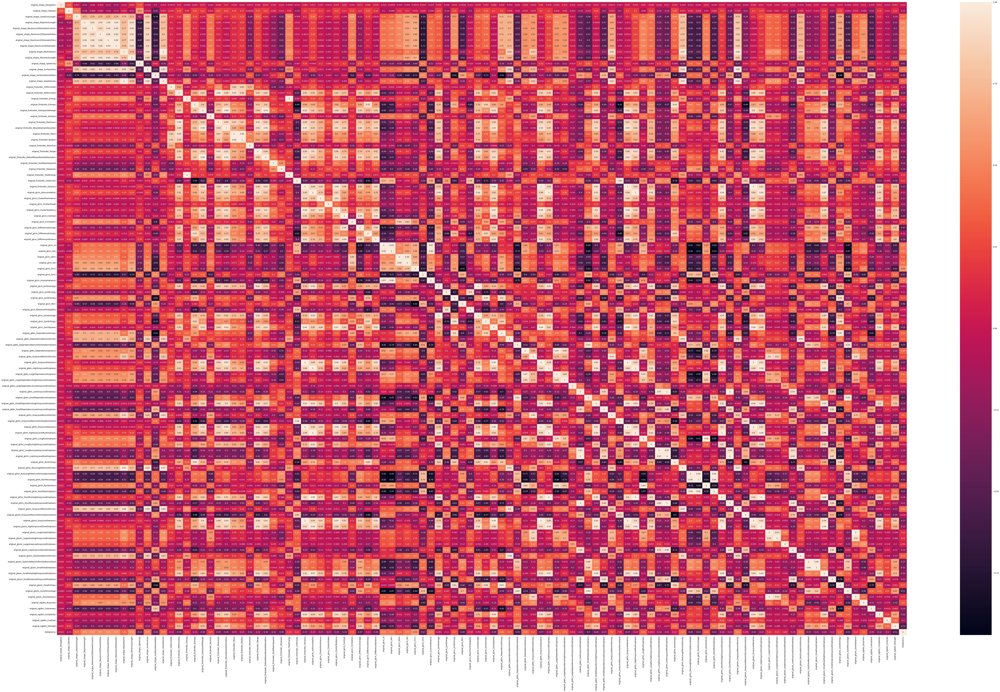

In [ ]:
#Usar o correlation coefficient para fazer feature selection

cor = features_df.corr()

plt.figure(figsize = (100,60))
sns.heatmap(cor, annot=True) #Matriz confusão com o coeficiente entre duas colunas, 
                             #interessa-nos a linha/coluna da malignancy

In [ ]:
#Obter uma lista com os nomes das features em que o coeficiente é maior que zero

useful_features_df = cor[cor['malignancy'] > 0]
column_names = useful_features_df.index.tolist()
print(column_names)

['original_shape_Elongation', 'original_shape_LeastAxisLength', 'original_shape_MajorAxisLength', 'original_shape_Maximum2DDiameterColumn', 'original_shape_Maximum2DDiameterRow', 'original_shape_Maximum2DDiameterSlice', 'original_shape_Maximum3DDiameter', 'original_shape_MeshVolume', 'original_shape_MinorAxisLength', 'original_shape_SurfaceArea', 'original_shape_VoxelVolume', 'original_firstorder_Energy', 'original_firstorder_Kurtosis', 'original_firstorder_TotalEnergy', 'original_firstorder_Uniformity', 'original_glcm_Correlation', 'original_glcm_Id', 'original_glcm_Idm', 'original_glcm_Idmn', 'original_glcm_Idn', 'original_glcm_Imc1', 'original_glcm_InverseVariance', 'original_glcm_JointEntropy', 'original_glcm_MaximumProbability', 'original_glcm_SumEntropy', 'original_gldm_DependenceEntropy', 'original_gldm_DependenceNonUniformity', 'original_gldm_DependenceVariance', 'original_gldm_GrayLevelNonUniformity', 'original_gldm_LargeDependenceEmphasis', 'original_gldm_LargeDependenceHighG

In [ ]:
#Criar um dataframe só com as features selecionadas

cor_coe_df = features_df[column_names]
cor_coe_df

,original_shape_Elongation,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,original_shape_SurfaceArea,...,original_glrlm_RunVariance,original_glszm_GrayLevelNonUniformity,original_glszm_LargeAreaEmphasis,original_glszm_LargeAreaHighGrayLevelEmphasis,original_glszm_LargeAreaLowGrayLevelEmphasis,original_glszm_SizeZoneNonUniformity,original_glszm_ZoneEntropy,original_glszm_ZoneVariance,original_ngtdm_Busyness,malignancy
0,0.971849,7.523759,31.696116,38.013156,35.128336,44.045431,47.675990,4906.875000,30.803832,2672.895304,...,0.246036,58.058049,576.205266,804782.840814,0.418287,798.842011,6.470309,567.412320,0.418091,5
1,0.916718,20.146223,34.279675,39.051248,48.166378,45.276926,48.590122,12551.541667,31.424805,4258.089424,...,0.260077,73.200492,2235.148216,181482.581796,46.047298,526.172202,6.954316,2175.147662,1.818630,5
2,0.778668,5.949320,31.776383,32.015621,31.016125,38.832976,39.673669,2509.250000,24.743257,1836.340800,...,0.135549,29.566248,90.443515,9541.788006,1.399587,265.097629,6.693464,77.874166,0.540909,2
3,0.792367,6.629813,26.828139,28.160256,26.000000,35.846897,35.860842,2484.291667,21.257727,1441.134615,...,0.240209,45.803946,346.726264,157219.863132,0.791130,346.013564,5.889404,337.124671,0.642915,5
4,0.712728,1.915424,12.260528,9.055385,13.000000,13.601471,13.601471,146.166667,8.738420,224.260176,...,0.051311,4.763441,6.548387,2054.731183,0.192017,49.752688,5.078002,3.770609,0.125592,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2478,0.754891,6.857729,26.391811,24.000000,29.068884,29.681644,30.083218,2491.250000,19.922947,1403.955056,...,0.164203,34.007126,36.780681,3864.749802,12.587595,622.132225,6.678938,32.818595,0.454923,5
2479,0.626835,6.437901,27.865836,22.000000,27.018512,33.105891,34.597688,2009.166667,17.467295,1290.652908,...,0.203944,27.961672,132.391405,163371.557491,0.121768,475.729384,6.235164,126.816103,0.226477,5
2480,0.779488,4.868688,21.597968,26.019224,21.023796,25.317978,27.000000,1102.958333,16.835357,964.272531,...,0.187250,17.160494,87.786008,117571.843621,0.078420,263.769547,6.072550,82.418110,0.136218,5
2481,0.756286,1.173635,7.082728,6.000000,7.071068,6.708204,7.681146,28.791667,5.356570,73.740818,...,0.037741,2.652174,2.956522,150.826087,0.197981,13.173913,3.725104,0.771267,0.111220,2


Test accuracy:0.5919


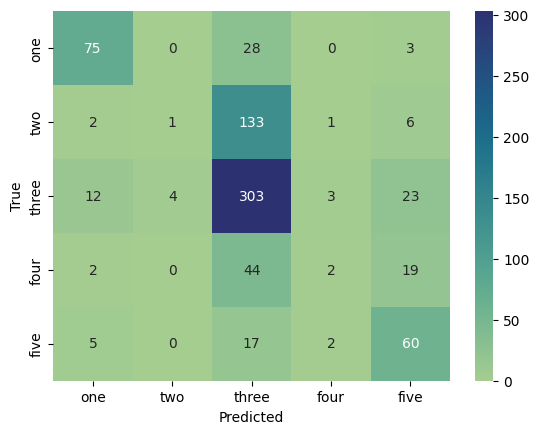

RandomForestClassifier(criterion='entropy', max_depth=6, max_features='log2',
                       n_estimators=500, random_state=42)


RandomForestClassifier(criterion='entropy', max_depth=6, max_features='log2',
                       n_estimators=500, random_state=42)

In [ ]:
#Treinar com as features obtidas através correlation coefficient

X = cor_coe_df.drop("malignancy", axis=1)
y = cor_coe_df[["malignancy"]]

train_model(X, y)

In [ ]:
#Usar o Information Gain para fazer feature selection

X = features_df.drop("malignancy", axis=1)
y = features_df[["malignancy"]]

importances = mutual_info_classif(X, y) #importância de cada features

#serie com todas as importâncias
feat_importances = pd.Series(importances, features_df.columns[0:len(features_df.columns)-1]) 

#serie com as 35 features com maior importância, 35 foi o número de features que escolhemos
top_35_features = feat_importances.nlargest(35) 

features = [] #Lista com os nomes das features com maior importância e a malignancy

for index, value in top_35_features.iteritems():
    features.append(index)

features.append("malignancy")

print(features)

['original_firstorder_90Percentile', 'original_glcm_Imc2', 'original_firstorder_Maximum', 'original_ngtdm_Strength', 'original_glszm_LargeAreaEmphasis', 'original_gldm_GrayLevelNonUniformity', 'original_glszm_ZoneVariance', 'original_glcm_Id', 'original_glszm_GrayLevelNonUniformity', 'original_glrlm_GrayLevelNonUniformity', 'original_shape_Maximum3DDiameter', 'original_ngtdm_Complexity', 'original_glcm_Imc1', 'original_firstorder_Mean', 'original_gldm_DependenceNonUniformityNormalized', 'original_glcm_ClusterProminence', 'original_glcm_DifferenceVariance', 'original_shape_MinorAxisLength', 'original_shape_MajorAxisLength', 'original_glrlm_RunPercentage', 'original_shape_SurfaceArea', 'original_shape_Maximum2DDiameterColumn', 'original_glszm_GrayLevelVariance', 'original_firstorder_Range', 'original_glcm_InverseVariance', 'original_glszm_ZonePercentage', 'original_glcm_ClusterShade', 'original_shape_Maximum2DDiameterRow', 'original_gldm_LargeDependenceEmphasis', 'original_ngtdm_Contrast

In [ ]:
information_gain_features_df =  features_df[features] #Dataframe com as 35 features mais importantes
information_gain_features_df.head()

,original_firstorder_90Percentile,original_glcm_Imc2,original_firstorder_Maximum,original_ngtdm_Strength,original_glszm_LargeAreaEmphasis,original_gldm_GrayLevelNonUniformity,original_glszm_ZoneVariance,original_glcm_Id,original_glszm_GrayLevelNonUniformity,original_glrlm_GrayLevelNonUniformity,...,original_glcm_ClusterShade,original_shape_Maximum2DDiameterRow,original_gldm_LargeDependenceEmphasis,original_ngtdm_Contrast,original_glszm_HighGrayLevelZoneEmphasis,original_glrlm_GrayLevelVariance,original_glrlm_LongRunEmphasis,original_gldm_GrayLevelVariance,original_glrlm_HighGrayLevelRunEmphasis,malignancy
0,131.0,0.720425,253.0,1.433190,576.205266,325.909788,567.412320,0.377508,58.058049,243.431370,...,-2439.712884,35.128336,31.027447,0.262738,728.052663,69.508734,1.584610,66.142363,1027.620097,5
1,-536.0,0.900037,-39.0,0.980011,2235.148216,734.373879,2175.147662,0.457274,73.200492,605.585054,...,448.700776,48.166378,35.727432,0.048390,246.830258,26.324571,1.689016,25.713473,157.689870,5
2,-465.1,0.799431,176.0,4.007826,90.443515,146.847364,77.874166,0.376161,29.566248,129.760647,...,673.075386,31.016125,16.877262,0.090857,230.096234,34.405029,1.371470,32.764765,155.219733,2
3,43.8,0.657813,276.0,0.886752,346.726264,195.323916,337.124671,0.392735,45.803946,148.289433,...,-414.641082,26.000000,32.101472,0.187159,205.877928,29.120632,1.578701,28.064092,309.144779,5
4,-12.0,0.981921,34.0,6.024134,6.548387,8.548387,3.770609,0.268623,4.763441,7.969546,...,-423.286895,13.000000,5.954839,0.650644,137.817204,39.209607,1.141444,39.514006,190.356397,4


Test accuracy:0.6094


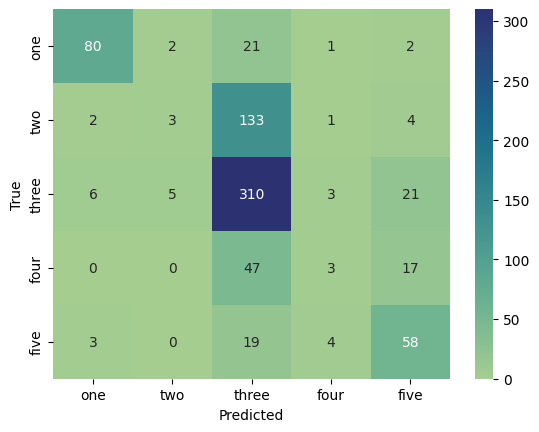

RandomForestClassifier(max_depth=8, max_features='log2', n_estimators=500,
                       random_state=42)


RandomForestClassifier(max_depth=8, max_features='log2', n_estimators=500,
                       random_state=42)

In [ ]:
#Treinar com as features obtidas com o information gain

X = information_gain_features_df.drop("malignancy", axis=1)
y = information_gain_features_df[["malignancy"]]

train_model(X, y)

Test accuracy:0.6107


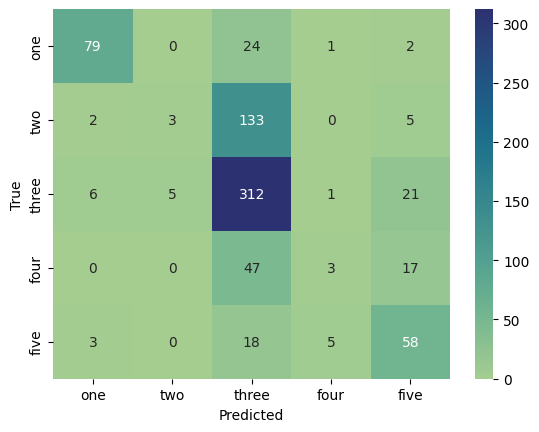

RFE(estimator=RandomForestClassifier(max_depth=6, max_features='auto',
                                     n_estimators=200, random_state=42))


In [ ]:
#Usar o Recursive Feature Elimination para fazer feature selection e treinar com as features obtidas

X = features_df.drop("malignancy", axis=1)
y = features_df[["malignancy"]]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

best_clf = get_best_clf(X_train, y_train)

rfe = RFE(best_clf)

rfe.fit(X_train, y_train)

pred = rfe.predict(X_test)
accuracy = accuracy_score(y_test, pred)

print(f"Test accuracy:{accuracy:.4f}")
print_confusion_matrix(pred, y_test)
print(rfe)

Para este dataset, o método que obteve melhores resultados foi treinar com as features obtidas através de Recursive Feature Exctracting, ainda que a diferença para os outros métodos não tenha sido significativa.
Um dos motivos que achamos que possa ter afetado negativamente a performance do nosso modelo foi a maneira como decidimos calcular a malignancy de cada nódulo. Dito isto é preciso notar que grande parte das previsões erradas foram em nódulos que o modelo classificou como tendo malignancy 3, o que é normal que aconteça visto que quase 50% dos casos de treino têm esta malignancy. Sendo que quando um nódulo tem malignancy 3 não há certeza se o nódulo é maligno ou não, um próximo passo, caso déssemos continuidade a este trabalho após estes teste, seria treinar um modelo sem os nódulos com malignancy 3. Possivelmente, accuracy seria melhor visto que o modelo não estaria tão inclinado a classificar um nódulo com malignancy 3.
Outra solução poderia passar por classificar os nódulos classificados com 1 e 2 como benignos e os nódulos classificados com 3, 4 e 5 como malignos. Achamos que faz sentido agrupar os nódulos desta maneira pois no caso de não haver certeza se o nódulo é maligno ou não (malignancy=3), mais vale assumir que o é e verificar-se que não o era com uma biopsia, por exemplo, do que o contrário que, aquando da descoberta, pode já ser tarde demais. Com esta solução, grande parte dos erros estariam quando a malignancy real é 1 e 2, e o modelo classificou como 3. Ainda que não seja desejável, estes erros não são muito problemático pois os nódulos iam ser classificados como malignos apesar de serem benignos o que, como já foi referido antes, não teria um grande impacto negativo além de serem feitas biopsias que poderiam ser desnecessárias.


Treinar com o número de nódulos reduzido, o processo é o mesmo que o feito com o dataset com todos os nódulos:

Test accuracy:0.5449


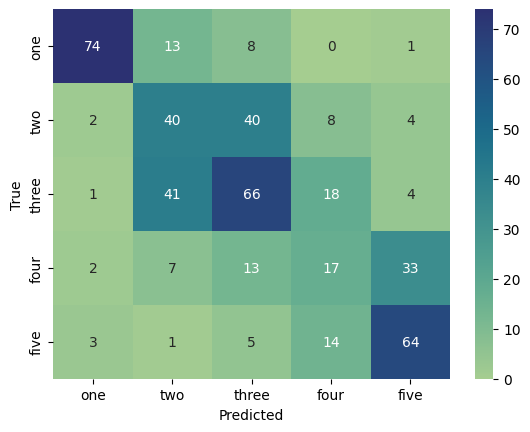

RandomForestClassifier(criterion='entropy', max_depth=7, n_estimators=500,
                       random_state=42)


RandomForestClassifier(criterion='entropy', max_depth=7, n_estimators=500,
                       random_state=42)

In [ ]:
#Todas as features

X = reduced_nodules_features_df.drop("malignancy", axis=1)
y = reduced_nodules_features_df[["malignancy"]]

train_model(X, y)

<Axes: >

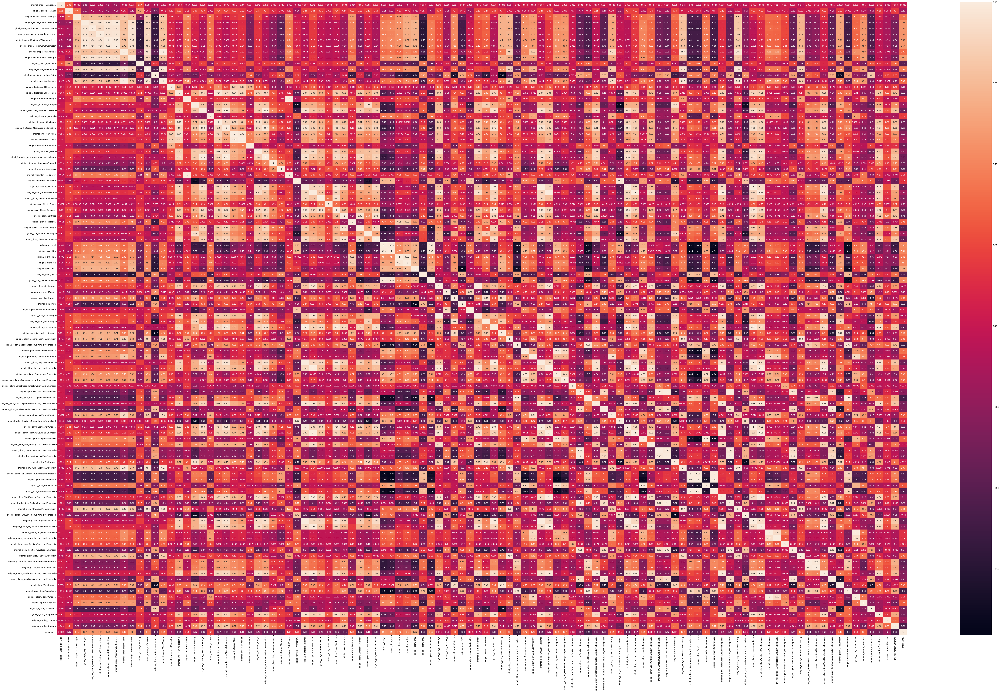

In [ ]:
#Correlation Coefficient

cor = reduced_nodules_features_df.corr()

plt.figure(figsize = (100,60))
sns.heatmap(cor, annot=True)

In [ ]:
useful_features_df = cor[cor['malignancy'] > 0]
column_names = useful_features_df.index.tolist()
print(column_names)

['original_shape_Elongation', 'original_shape_LeastAxisLength', 'original_shape_MajorAxisLength', 'original_shape_Maximum2DDiameterColumn', 'original_shape_Maximum2DDiameterRow', 'original_shape_Maximum2DDiameterSlice', 'original_shape_Maximum3DDiameter', 'original_shape_MeshVolume', 'original_shape_MinorAxisLength', 'original_shape_SurfaceArea', 'original_shape_VoxelVolume', 'original_firstorder_Energy', 'original_firstorder_Kurtosis', 'original_firstorder_TotalEnergy', 'original_firstorder_Uniformity', 'original_glcm_Correlation', 'original_glcm_Id', 'original_glcm_Idm', 'original_glcm_Idmn', 'original_glcm_Idn', 'original_glcm_Imc1', 'original_glcm_InverseVariance', 'original_glcm_JointEntropy', 'original_glcm_MaximumProbability', 'original_glcm_SumEntropy', 'original_gldm_DependenceEntropy', 'original_gldm_DependenceNonUniformity', 'original_gldm_DependenceVariance', 'original_gldm_GrayLevelNonUniformity', 'original_gldm_LargeDependenceEmphasis', 'original_gldm_LargeDependenceHighG

In [ ]:
cor_coe_df = reduced_nodules_features_df[column_names]
cor_coe_df

,original_shape_Elongation,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,original_shape_SurfaceArea,...,original_glrlm_RunVariance,original_glszm_GrayLevelNonUniformity,original_glszm_LargeAreaEmphasis,original_glszm_LargeAreaHighGrayLevelEmphasis,original_glszm_LargeAreaLowGrayLevelEmphasis,original_glszm_SizeZoneNonUniformity,original_glszm_ZoneEntropy,original_glszm_ZoneVariance,original_ngtdm_Busyness,malignancy
0,0.971849,7.523759,31.696116,38.013156,35.128336,44.045431,47.675990,4906.875000,30.803832,2672.895304,...,0.246036,58.058049,576.205266,804782.840814,0.418287,798.842011,6.470309,567.412320,0.418091,5
1,0.916718,20.146223,34.279675,39.051248,48.166378,45.276926,48.590122,12551.541667,31.424805,4258.089424,...,0.260077,73.200492,2235.148216,181482.581796,46.047298,526.172202,6.954316,2175.147662,1.818630,5
2,0.792367,6.629813,26.828139,28.160256,26.000000,35.846897,35.860842,2484.291667,21.257727,1441.134615,...,0.240209,45.803946,346.726264,157219.863132,0.791130,346.013564,5.889404,337.124671,0.642915,5
3,0.712728,1.915424,12.260528,9.055385,13.000000,13.601471,13.601471,146.166667,8.738420,224.260176,...,0.051311,4.763441,6.548387,2054.731183,0.192017,49.752688,5.078002,3.770609,0.125592,4
4,0.916656,4.519266,7.622326,8.544004,8.246211,8.944272,9.486833,129.583333,6.987050,174.501358,...,0.030421,2.793814,3.206186,1450.061856,0.062581,58.814433,5.893425,1.152726,0.042726,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1589,0.754891,6.857729,26.391811,24.000000,29.068884,29.681644,30.083218,2491.250000,19.922947,1403.955056,...,0.164203,34.007126,36.780681,3864.749802,12.587595,622.132225,6.678938,32.818595,0.454923,5
1590,0.626835,6.437901,27.865836,22.000000,27.018512,33.105891,34.597688,2009.166667,17.467295,1290.652908,...,0.203944,27.961672,132.391405,163371.557491,0.121768,475.729384,6.235164,126.816103,0.226477,5
1591,0.779488,4.868688,21.597968,26.019224,21.023796,25.317978,27.000000,1102.958333,16.835357,964.272531,...,0.187250,17.160494,87.786008,117571.843621,0.078420,263.769547,6.072550,82.418110,0.136218,5
1592,0.756286,1.173635,7.082728,6.000000,7.071068,6.708204,7.681146,28.791667,5.356570,73.740818,...,0.037741,2.652174,2.956522,150.826087,0.197981,13.173913,3.725104,0.771267,0.111220,2


Test accuracy:0.5177


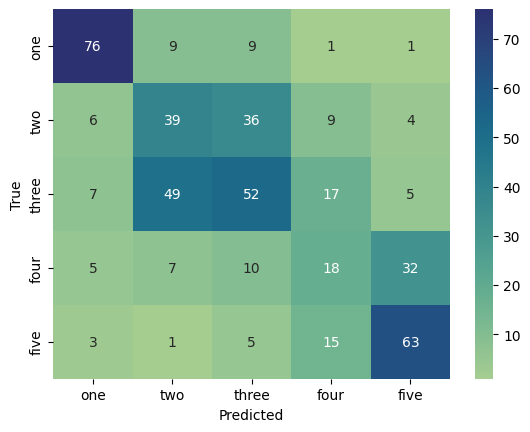

RandomForestClassifier(criterion='entropy', max_depth=8, max_features='auto',
                       n_estimators=200, random_state=42)


RandomForestClassifier(criterion='entropy', max_depth=8, max_features='auto',
                       n_estimators=200, random_state=42)

In [ ]:
X = cor_coe_df.drop("malignancy", axis=1)
y = cor_coe_df[["malignancy"]]

train_model(X, y)

In [ ]:
#Information Gain

X = reduced_nodules_features_df.drop("malignancy", axis=1)
y = reduced_nodules_features_df[["malignancy"]]

importances = mutual_info_classif(X, y)

feat_importances = pd.Series(importances, reduced_nodules_features_df.columns[0:len(reduced_nodules_features_df.columns)-1])

top_35_features = feat_importances.nlargest(35)

features = []

for index, value in top_35_features.iteritems():
    features.append(index)

features.append("malignancy")

print(features)

['original_firstorder_90Percentile', 'original_glcm_Imc2', 'original_ngtdm_Strength', 'original_firstorder_Maximum', 'original_glszm_LargeAreaEmphasis', 'original_glszm_ZoneVariance', 'original_gldm_DependenceNonUniformityNormalized', 'original_glszm_GrayLevelNonUniformity', 'original_glcm_Imc1', 'original_shape_MinorAxisLength', 'original_glrlm_ShortRunEmphasis', 'original_gldm_GrayLevelNonUniformity', 'original_glrlm_RunPercentage', 'original_shape_Maximum3DDiameter', 'original_glcm_Id', 'original_gldm_LargeDependenceEmphasis', 'original_glszm_ZonePercentage', 'original_shape_Maximum2DDiameterColumn', 'original_glrlm_GrayLevelNonUniformity', 'original_glcm_Idm', 'original_glszm_GrayLevelVariance', 'original_glcm_DifferenceVariance', 'original_firstorder_Mean', 'original_ngtdm_Contrast', 'original_glrlm_RunVariance', 'original_shape_MajorAxisLength', 'original_glcm_InverseVariance', 'original_shape_SurfaceArea', 'original_glrlm_LongRunEmphasis', 'original_glcm_ClusterProminence', 'ori

In [ ]:
information_gain_features_df =  reduced_nodules_features_df[features]
information_gain_features_df.head()

,original_firstorder_90Percentile,original_glcm_Imc2,original_ngtdm_Strength,original_firstorder_Maximum,original_glszm_LargeAreaEmphasis,original_glszm_ZoneVariance,original_gldm_DependenceNonUniformityNormalized,original_glszm_GrayLevelNonUniformity,original_glcm_Imc1,original_shape_MinorAxisLength,...,original_glcm_InverseVariance,original_shape_SurfaceArea,original_glrlm_LongRunEmphasis,original_glcm_ClusterProminence,original_glcm_SumSquares,original_gldm_SmallDependenceEmphasis,original_firstorder_Range,original_glrlm_RunLengthNonUniformity,original_gldm_GrayLevelVariance,malignancy
0,131.0,0.720425,1.433190,253.0,576.205266,567.412320,0.131568,58.058049,-0.130096,30.803832,...,0.283404,2672.895304,1.584610,9.676912e+04,47.810685,0.301516,1066.0,3500.113378,66.142363,5
1,-536.0,0.900037,0.980011,-39.0,2235.148216,2175.147662,0.105565,73.200492,-0.208772,31.424805,...,0.368480,4258.089424,1.689016,2.274897e+04,23.995378,0.137280,912.0,7797.544199,25.713473,5
2,43.8,0.657813,0.886752,276.0,346.726264,337.124671,0.131526,45.803946,-0.094868,21.257727,...,0.293188,1441.134615,1.578701,1.253086e+04,23.153753,0.282363,769.0,1741.998417,28.064092,5
3,-12.0,0.981921,6.024134,34.0,6.548387,3.770609,0.308304,4.763441,-0.413525,8.738420,...,0.181054,224.260176,1.141444,1.929139e+04,35.384039,0.526712,523.0,138.028390,39.514006,4
4,295.2,0.999151,62.401425,918.0,3.206186,1.152726,0.380881,2.793814,-0.623517,6.987050,...,0.120948,174.501358,1.092826,1.869156e+06,287.112347,0.620054,1697.0,127.250944,243.381088,1


Test accuracy:0.5282


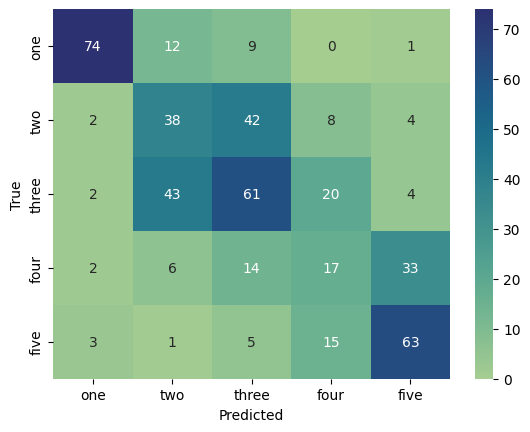

RandomForestClassifier(criterion='entropy', max_depth=6, max_features='log2',
                       n_estimators=200, random_state=42)


RandomForestClassifier(criterion='entropy', max_depth=6, max_features='log2',
                       n_estimators=200, random_state=42)

In [ ]:
X = information_gain_features_df.drop("malignancy", axis=1)
y = information_gain_features_df[["malignancy"]]

train_model(X, y)

Test accuracy:0.5282


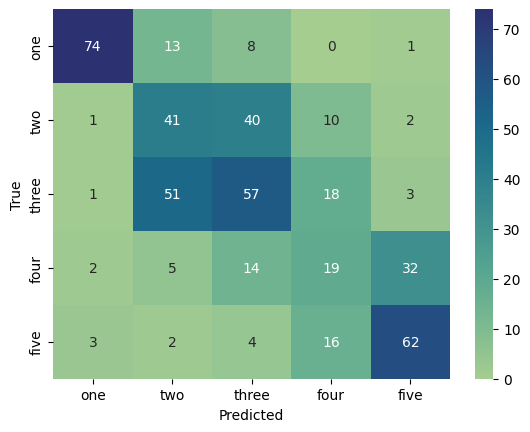

RFE(estimator=RandomForestClassifier(max_depth=8, max_features='log2',
                                     n_estimators=500, random_state=42))


In [ ]:
#Recursive Feature Elimination

X = reduced_nodules_features_df.drop("malignancy", axis=1)
y = reduced_nodules_features_df[["malignancy"]]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)


best_clf = get_best_clf(X_train, y_train)

rfe = RFE(best_clf)

rfe.fit(X_train, y_train)

pred = rfe.predict(X_test)
accuracy = accuracy_score(y_test, pred)

print(f"Test accuracy:{accuracy:.4f}")
print_confusion_matrix(pred, y_test)
print(rfe)

Para este dataset, o método que obteve melhores resultados foi treinar o modelo com as features originais. Os resultados obtidos com este dataset foram piores, ficando muito perto dos 51% de accuracy, que pouco melhor é que atirar uma moeda ao ar. Posto isto, poderiamos tentar treinar um modelo com um dataset mais equilibrado, mas, em vez de retirar exemplos, acrescentariamos exemplos as classes até estarem com um número mais uniforme, utilizando técnicas de random over sampling, por exemplo. Com isto estariamos sempre a correr o risco de haver overfitting.  

